### Homework¶
1. Find a way to represent the entire time series in a single file. You may either save a visualization for every data on separate pages in a pdf or you may create an MP4 or GIF file. Make sure that for every frame, the correct date is indicated. Differentiate your answer from the template provided in at least 3 ways. Identify how your output is differentiated.

To begin, I will recreate the data from class in order to make a PDF of the time series.

In [1]:
import geopandas
import numpy as np
import pandas as pd

import datetime

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick
import datadotworld as dw

def import_covid_data(FIPS_name):
    # Load COVID19 county data using datadotworld API
    # Data provided by Johns Hopkins, file provided by Associated Press
    dataset = dw.load_dataset(
        "associatedpress/johns-hopkins-coronavirus-case-tracker",
        auto_update = True)
    
    #the dataset includes multiple dataframes. We will only use #2
    covid_data = dataset.dataframes[
        "2_cases_and_deaths_by_county_timeseries"]
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    # Transform FIPS codes into integers
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(int)
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    
    # Prepare a column for state abbreviations. we will draw these 
    # from state_dict
    covid_data["state_abr"] = ""
    for state, abr in state_dict.items():
        #.loc[row(s), col]
        covid_data.loc[
            covid_data["state"] == state, "state_abr"] = abr
    # save location name as Cass, ND 
    covid_data["Location"] = covid_data["location_name"] + ", " +\
        covid_data["state_abr"]
    return covid_data

    return covid_data


def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

# I include this dictionary to convenienlty cross reference state names and
# state abbreviations.
state_dict = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'}

fips_name = "fips_code"
# rename_FIPS matches map_data FIPS with COVID19 FIPS name
covid_data = import_covid_data(FIPS_name = fips_name)
covid_data

C:\Users\gwens\anaconda3\lib\site-packages\datadotworld\models\dataset.py:206: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  warnings.warn(


uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2020-11-16  84056045        county        Weston  Wyoming   
          2020-11-17  84056045        county        Weston  Wyoming   
          2020-11-18  84056045        county        Weston  Wyoming   
          2020-11-19  84056045        county        Weston  Wyoming   
          2020-11-20  84056045        county        Weston  Wyoming   

                      total_population  cumulative_cases  \
fips_code date                                             
1001      2020-01-22           55200.0                 0   
          2020-01-23           55200.0                 0   
          2020-01-24           55200.0                 0   
          2020-01-25           55200.0                 0   
          2020-01-26           55200.0                 0   
...                                ...               ...   
56045     2020-11-16            7100.0               338   
          2020-11-17            7100.0               346   
          2020-11-18            7100.0               353   
          2020-11-19            7100.0               355   
          2020-11-20            7100.0               364   

                      cumulative_cases_per_100_000  cumulative_deaths  \
fips_code date                                                          
1001      2020-01-22                          0.00                  0   
          2020-01-23                          0.00                  0   
          2020-01-24                          0.00                  0   
          2020-01-25                          0.00                  0   
          2020-01-26                          0.00                  0   
...                                            ...                ...   
56045     2020-11-16                       4760.56                  0   
          2020-11-17                       4873.24                  0   
          2020-11-18                       4971.83                  0   
          2020-11-19                       5000.00                  0   
          2020-11-20                       5126.76                  0   

                      cumulative_deaths_per_100_000  new_cases  new_deaths  \
fips_code date                                                               
1001      2020-01-22                            0.0        NaN         NaN   
          2020-01-23                            0.0        0.0         0.0   
          2020-01-24                            0.0        0.0         0.0   
          2020-01-25                            0.0        0.0         0.0   
          2020-01-26                            0.0        0.0         0.0   
...                                             ...        ...         ...   
56045     2020-11-16                            0.0       -1.0         0.0   
          2020-11-17                            0.0        8.0         0.0   
          2020-11-18                            0.0        7.0         0.0   
          2020-11-19                            0.0        2.0         0.0   
          2020-11-20                            0.0        9.0         0.0   

                      new_cases_per_100_000  new_deaths_per_100_000  \
fips_code date                                                        
1001      2020-01-22                    NaN                     NaN   
          2020-01-23                   0.00                     0.0   
          2020-01-24                   0.00                     0.0   
  

Add the geodata in order to create the map.

In [2]:
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "Date", FIPS_name= fips_name)
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


Check to see if the geo data is functioning by seeing the population of the whole map.

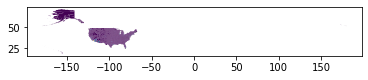

In [3]:
map_data.plot(column = "Population")

The county-level data still needs to be geocoded. The following code will create a geodataframe for each data. Then we can add the Covid data for each date. Then the dataframes can be stacked to show the time series.

In [4]:
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    counties =data.groupby("fips_code").mean().index
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd

dates =covid_data.groupby("date").mean().index
covid_data = create_merged_geo_dataframe(covid_data, map_data, dates)
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,cumulative_deaths,cumulative_deaths_per_100_000,new_cases,new_deaths,new_cases_per_100_000,new_deaths_per_100_000,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Autauga, AL"
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Baldwin, AL"
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Barbour, AL"
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bibb, AL"
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Blount, AL"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-20,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,6,13.60,84.0,0.0,190.40,0.0,51.71,0.29,WY,"Sweetwater, WY"
56039,2020-11-20,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,2,8.67,38.0,0.0,164.79,0.0,32.57,0.00,WY,"Teton, WY"
56041,2020-11-20,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,4,19.41,25.0,0.0,121.31,0.0,29.71,0.00,WY,"Uinta, WY"


In order to accurately compare data, population needs to be taken into account. The daily rate of new cases and deaths per million will be calculated.

In [5]:
def create_new_vars(covid_data, moving_average_days):
    #use a for loop that performs the same ops for cases and deaths
    for key in ("cases", "deaths"):
        cap_key = key.title()
        covid_data[cap_key + " per Million"] = covid_data["cumulative_" + key]\
            .div(covid_data["total_population"]).mul(10 ** 6) 
        #group by county ("fips_code")
        covid_data["Daily " + cap_key + " per Million"] = \
            covid_data["cumulative_" + key ].groupby(covid_data.index.names[0])\
            .diff(1).div(covid_data["total_population"]).mul(10 ** 6)
        covid_data["Daily " + cap_key + " per Million MA"] = covid_data["Daily " + \
                  cap_key + " per Million"].rolling(moving_average_days).mean()
        
moving_average_days = 7
create_new_vars(covid_data,moving_average_days)

covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location,Cases per Million,Daily Cases per Million,Daily Cases per Million MA,Deaths per Million,Daily Deaths per Million,Daily Deaths per Million MA
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,NaN,NaN,AL,"Autauga, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,NaN,NaN,AL,"Baldwin, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,NaN,NaN,AL,"Barbour, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,NaN,NaN,AL,"Bibb, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,NaN,NaN,AL,"Blount, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-20,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,51.71,0.29,WY,"Sweetwater, WY",30668.449804,1904.027926,1693.212206,136.001995,0.0,0.0
56039,2020-11-20,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,32.57,0.00,WY,"Teton, WY",57938.332105,1647.946572,1630.903334,86.734030,0.0,0.0
56041,2020-11-20,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,29.71,0.00,WY,"Uinta, WY",43379.106216,1213.062254,1512.414562,194.089961,0.0,0.0


Again, we will call all the mapping tools and include only the lower 48 states by setting bounds on the map. We will instead do Cases per Million

In [6]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick

def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

date = dates[-1]

#map bounds
if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -66
    maxy = 48
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    covid_map_bounded = True

In order to make the graph more readable, we can divide the colors into distinct categories. We can also use more colors to see more distinction between deaths per million. Let's just add the colorbar right away too.

And we will plot all 4 graphs: Cases per Million, Deaths per Million, Daily Cases moving average, Daily Deaths moving average

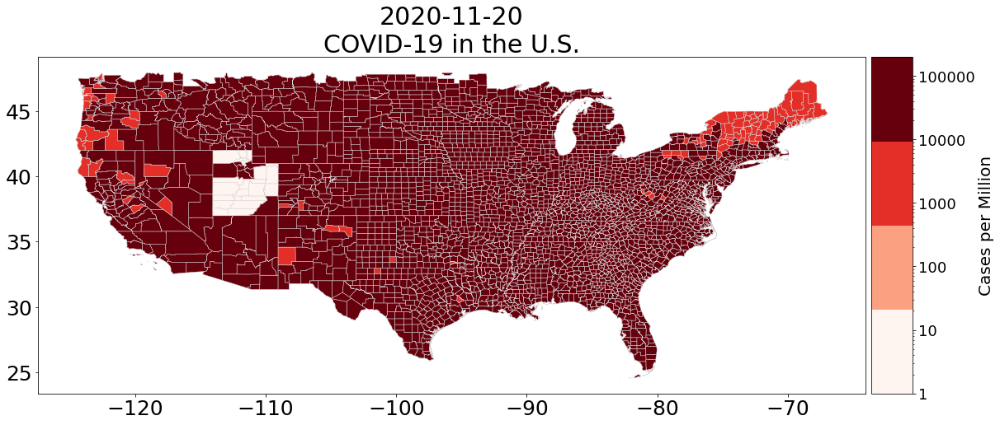

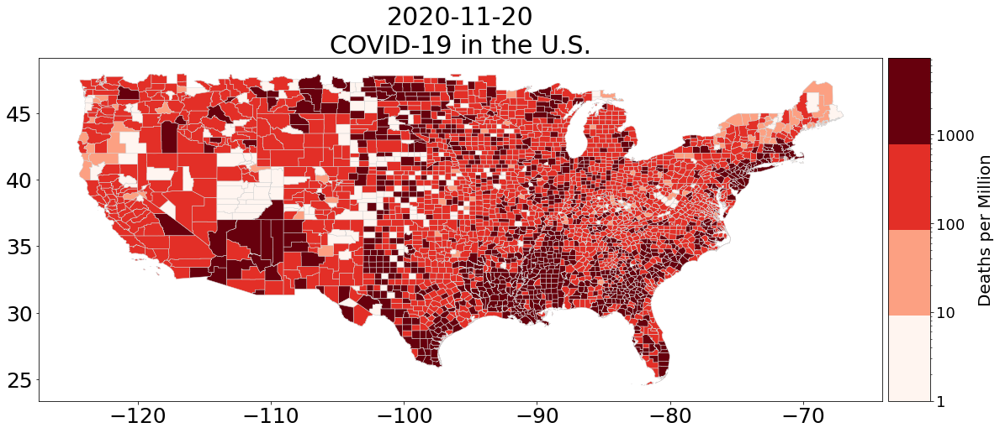

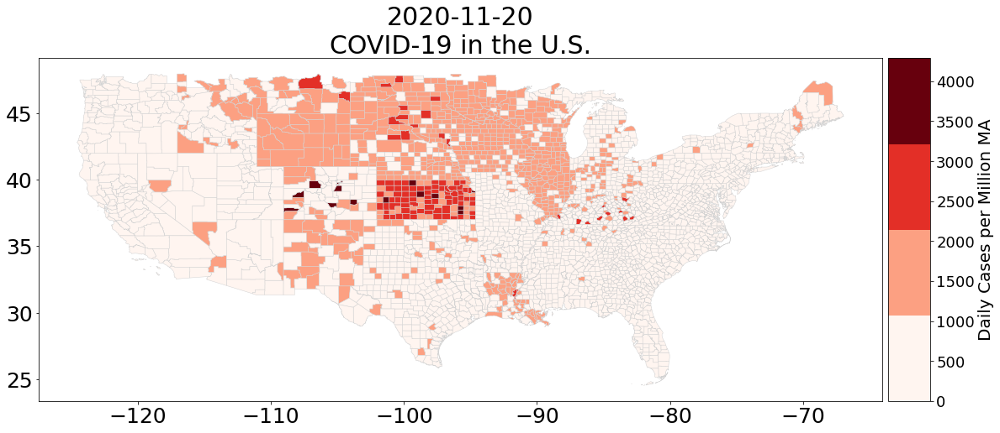

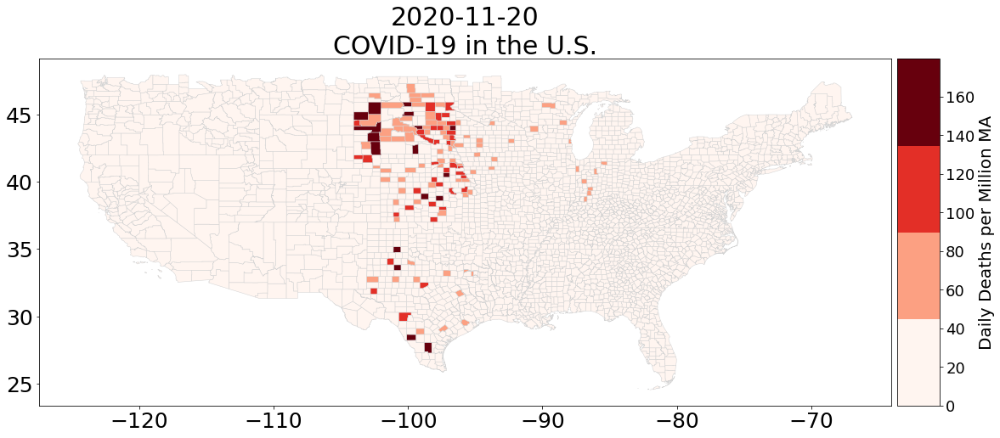

In [7]:
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]
for key in keys:
    log = False if "Daily" in key else True
    fig, ax = plt.subplots(figsize=(19,9),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # this time we replace 0 values with 1
    # so that these values show up as beige instead of as white
    # when color axis is logged
    df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
    # set range of colorbar
    vmin = 1 if log else 0 
    vmax = df[key].max()
    # choose colormap
    cmap = cm.get_cmap('Reds', 4)
    # format colormap
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%" 
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)

    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)


    df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

    plt.show()
    plt.close()

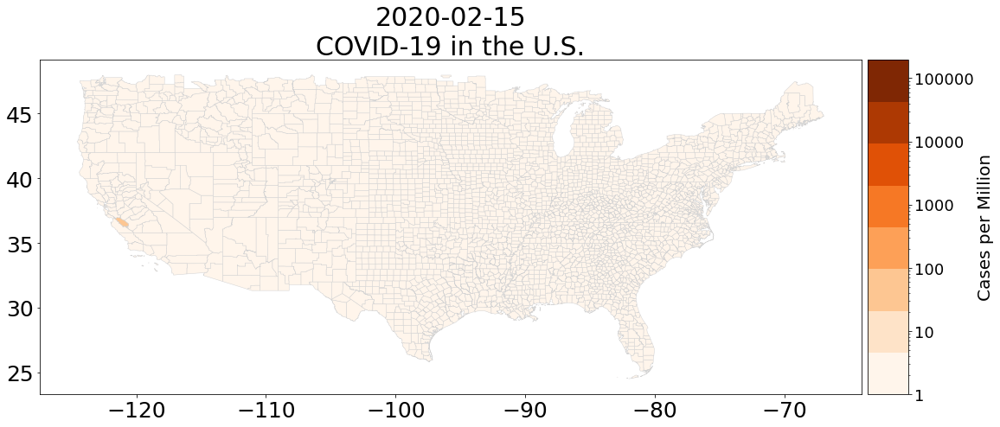

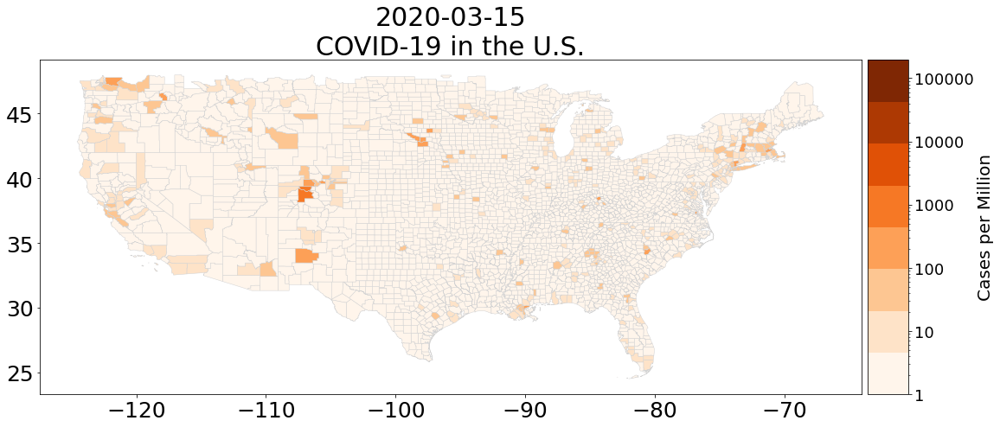

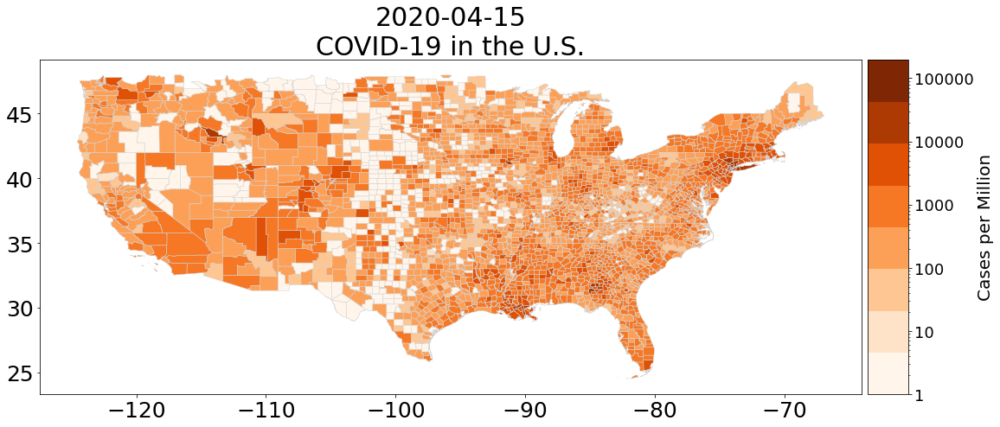

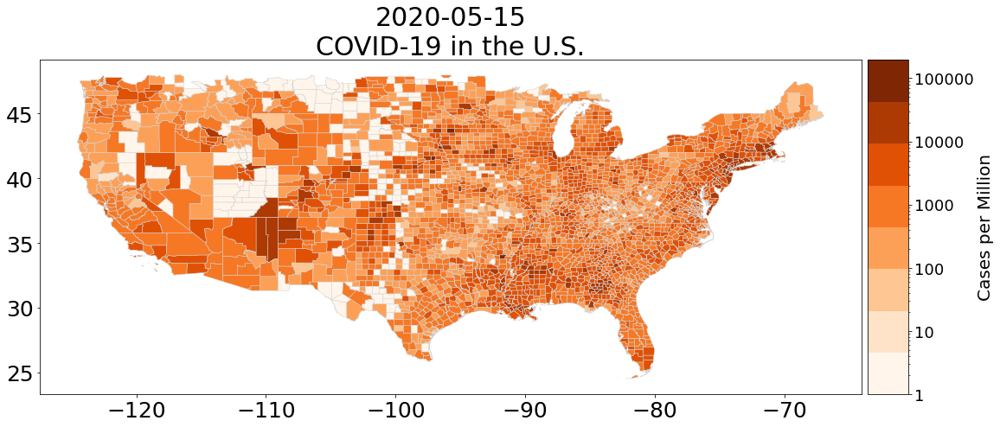

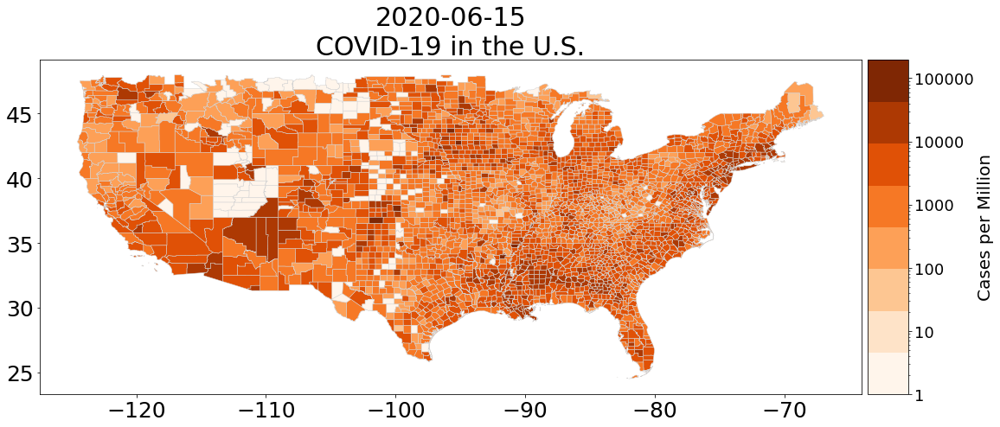

...

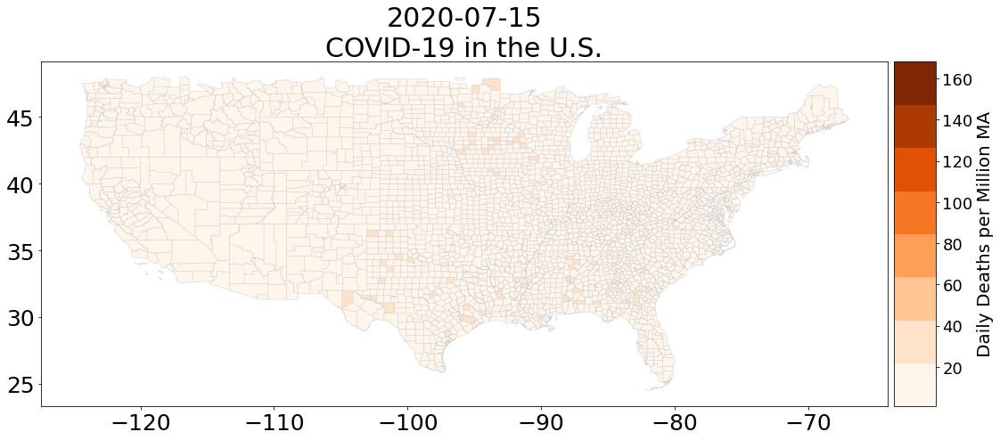

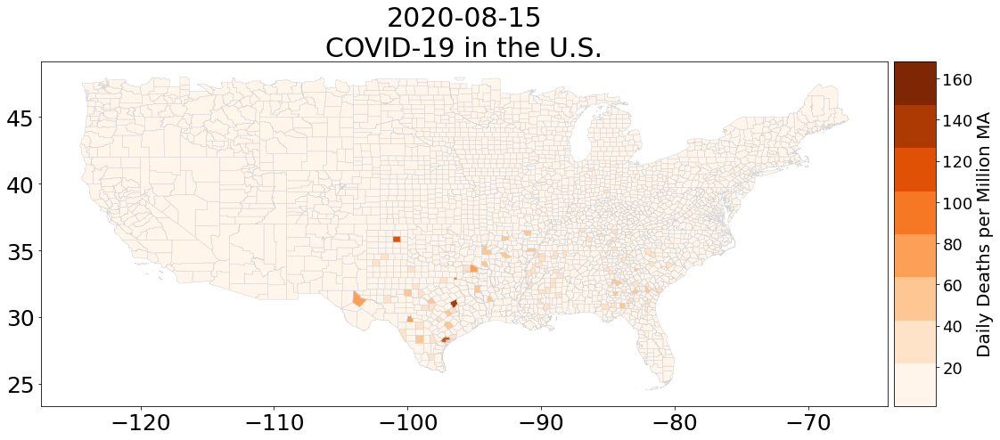

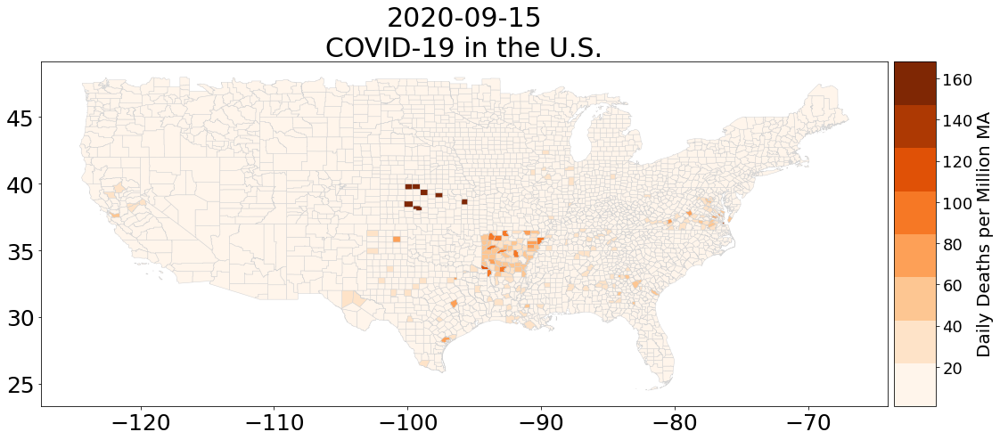

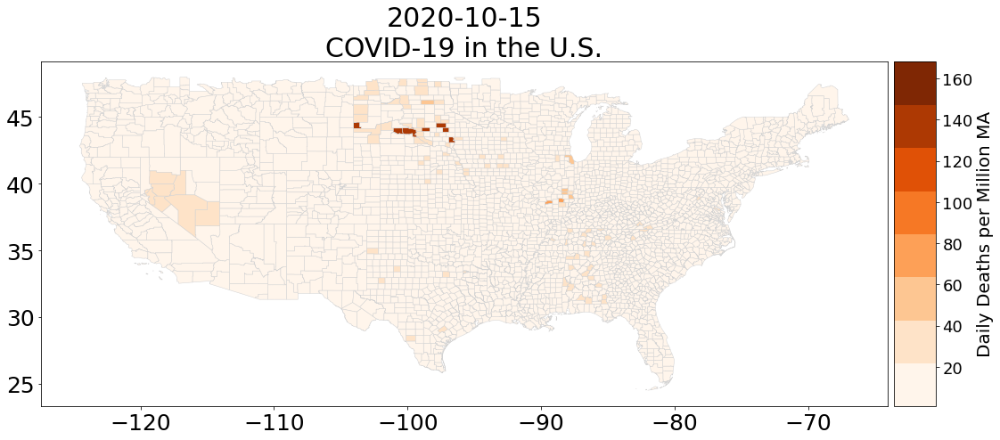

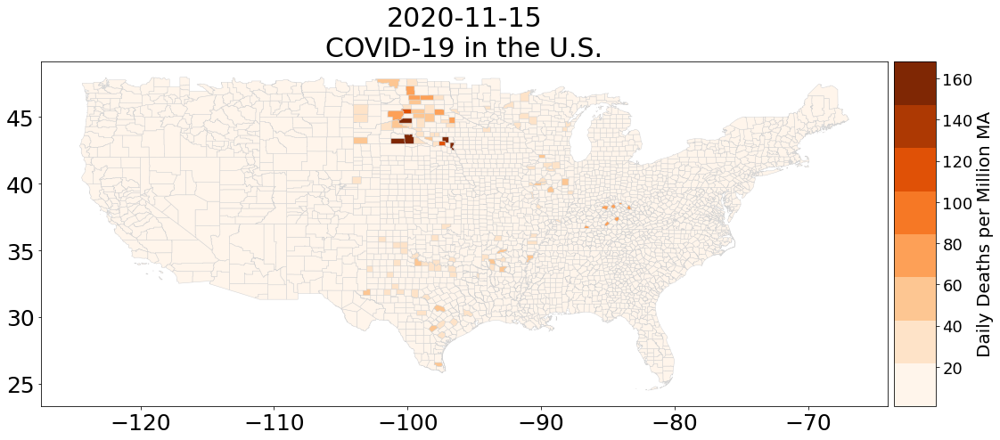

In [8]:
import geopandas
import numpy as np
import pandas as pd
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages("New_Covid19_Map.pdf")

keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]

dates = sorted(list(set(covid_data.index.get_level_values("date"))))
dates = [date for date in dates if "15" in date]

for key in keys:
    vmin = 1 
    vmax = df[key].max()
    
    for date in dates:
        log = False if "Daily" in key else True
        fig, ax = plt.subplots(figsize=(18,8),
            subplot_kw = {'aspect': 'equal'})   
        plt.rcParams.update({"font.size": 30})
        plt.xticks(fontsize = 25)
        plt.yticks(fontsize = 25)
        # this time we replace 0 values with 1
        # so that these values show up as beige instead of as white
        # when color axis is logged
        df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
 
        # choose colormap
        cmap = cm.get_cmap('Oranges', 8)
        # format colormap
        if log:
            norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
        else:
            norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        # empty array for the data range
        sm._A = []
        # prepare space for colorbar
        divider = make_axes_locatable(ax)
        size = "5%" 
        cax = divider.append_axes("right", size = size, pad = 0.1)
        # add colorbar to figure
        cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
        cbar.ax.tick_params(labelsize=18)
        vals = list(cbar.ax.get_yticks())
        vals.append(vmax)

        # format colorbar values as int
        cbar.ax.set_yticklabels([int(x) for x in vals])
        cbar.ax.set_ylabel(key, fontsize = 20)


        df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                     cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                     norm = norm)
        ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

        plt.show()
        pp.savefig(fig, bbox_inches="tight")
        plt.close()
        
pp.close()

I did oranges instead of reds for better visibility. I also upped the number of colors of orange to 8 because now that the rates are so high, it seems to differentiate between them better. 

# #2 
Select a different time series data (e.g., unemployment, incomes, etc...) set at the county level that has at least 20 observations. Create a map of the latest obervation of the data. Like with the covid data in (1), create a file that holds a visualization for every observation.

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

wheat_data = pd.read_csv("SpringWheatYieldbyCounty.csv",
                    index_col = [0, 2])
wheat_data.dropna()

,,County,Yield
fips_code,date,,
38031,2019,FOSTER,52.5
38043,2019,KIDDER,36.9
38093,2019,STUTSMAN,43.5
38003,2019,BARNES,52.6
38017,2019,CASS,48.9
...,...,...,...
38025,1989,DUNN,18.0
38053,1989,MCKENZIE,20.5
38055,1989,MCLEAN,16.6


In [10]:
def import_wheat_data(filename, fips_code):
    # wheat data using read csv
    wheat_data = pd.read_csv("SpringWheatYieldbyCounty.csv",
                    index_col = [0, 2])

    wheat_data[fips_code] = wheat_data[fips_code].astype(int)
    wheat_data.set_index([fips_code, "date"], inplace = True)
    
    return wheat_data

wheat_data.dropna()

,,County,Yield
fips_code,date,,
38031,2019,FOSTER,52.5
38043,2019,KIDDER,36.9
38093,2019,STUTSMAN,43.5
38003,2019,BARNES,52.6
38017,2019,CASS,48.9
...,...,...,...
38025,1989,DUNN,18.0
38053,1989,MCKENZIE,20.5
38055,1989,MCLEAN,16.6


In [11]:
import geopandas
import numpy as np
import pandas as pd
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages


def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

fips_name = "fips_code" 

In [12]:
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "date", FIPS_name = fips_name)

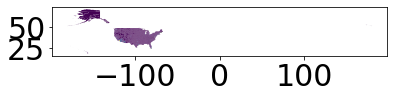

In [13]:
map_data.plot(column = "Population")

In [14]:
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


In [15]:
dates = ["2019",
        "2018",
        "2017",
        "2016",
        "2015",
        "2014",
        "2013",
        "2012",
        "2011",
        "2010",
        "2009",
        "2008",
        "2007",
        "2006",
        "2005",
        "2004",
        "2003",
        "2002",
        "2001",
        "2000",
        "1999",
        "1998",
        "1997",
        "1996",
        "1995",
        "1994",
        "1993",
        "1992",
        "1991",
        "1990",
        "1989"]

In [16]:
def create_wheat_geo_dataframe(wheat_data, map_data, dates):
    # create geopandas dataframe with multiindex for date
    # original geopandas dataframe had no dates, so copies of the df are 
    # stacked vertically, with a new copy for each date in the ndsoy_data index
    #(dates is a global)
    data_frame_initialized = False
    counties = wheat_data.groupby("fips_code").mean().index
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in wheat_data.items():
        matching_gpd[key] = val
    return matching_gpd

# dates will be used to create a geopandas DataFrame with multiindex 
dates = wheat_data.groupby("date").mean().index
wheat_data = create_wheat_geo_dataframe(wheat_data, map_data, dates)

In [17]:
wheat_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry,County,Yield
fips_code,date,,,,,,,,,,,,,
38001,1989,38,001,01034210,0500000US38001,Adams,06,2557900104,2894336,2216.0,North Dakota,"POLYGON ((-102.99571 46.20573, -102.99556 46.2...",ADAMS,19.0
38003,1989,38,003,01034225,0500000US38003,Barnes,06,3863107416,56591280,10415.0,North Dakota,"POLYGON ((-98.46732 47.06655, -98.46734 47.095...",BARNES,25.0
38005,1989,38,005,01034216,0500000US38005,Benson,06,3596569006,131708143,6832.0,North Dakota,"POLYGON ((-99.84825 48.14069, -99.84782 48.195...",BENSON,17.5
38007,1989,38,007,01035616,0500000US38007,Billings,06,2975481849,11990485,928.0,North Dakota,"POLYGON ((-103.66691 47.12501, -103.66672 47.3...",BILLINGS,18.0
38009,1989,38,009,01034227,0500000US38009,Bottineau,06,4321196488,74864998,6282.0,North Dakota,"POLYGON ((-101.49674 48.99964, -101.45674 48.9...",BOTTINEAU,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38097,2019,38,097,01034221,0500000US38097,Traill,06,2232437901,1462184,8036.0,North Dakota,"POLYGON ((-97.47401 47.41144, -97.47391 47.439...",TRAILL,53.0
38099,2019,38,099,01034214,0500000US38099,Walsh,06,3319506407,32184273,10641.0,North Dakota,"POLYGON ((-98.31830 48.41323, -98.31825 48.456...",WALSH,59.1
38101,2019,38,101,01034231,0500000US38101,Ward,06,5213657405,111223368,67641.0,North Dakota,"POLYGON ((-102.23391 48.63331, -102.23360 48.7...",WARD,44.7


Text(0.5, 1.0, '2019\nWheat Yield in N.D.')

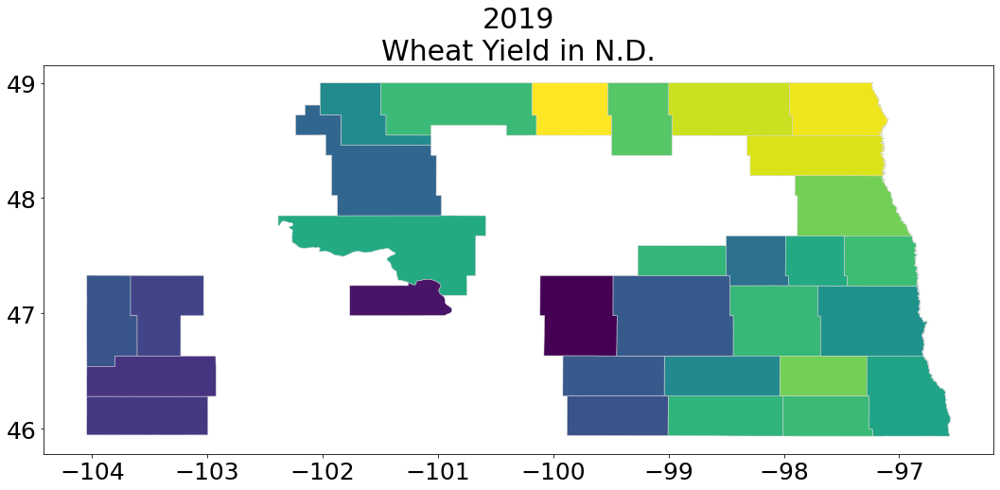

In [18]:
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

# . . . to end of script
# choose most recent date in data
date = dates[-1]

# choose map bounds
if "map_bounded" not in locals():
    minx = -200
    miny = 0
    maxx = -90
    maxy = 100
    wheat_data = select_data_within_bounds(wheat_data, minx, miny, maxx, maxy)
    map_bounded = True
    
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Yield"
df = wheat_data[wheat_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, linewidth=.5, 
             edgecolor='lightgrey')
ax.set_title(str(date) + "\n" + "Wheat Yield in N.D.", fontsize = 30)

Text(0.5, 1.0, '2019\nWheat Yield in N.D.')

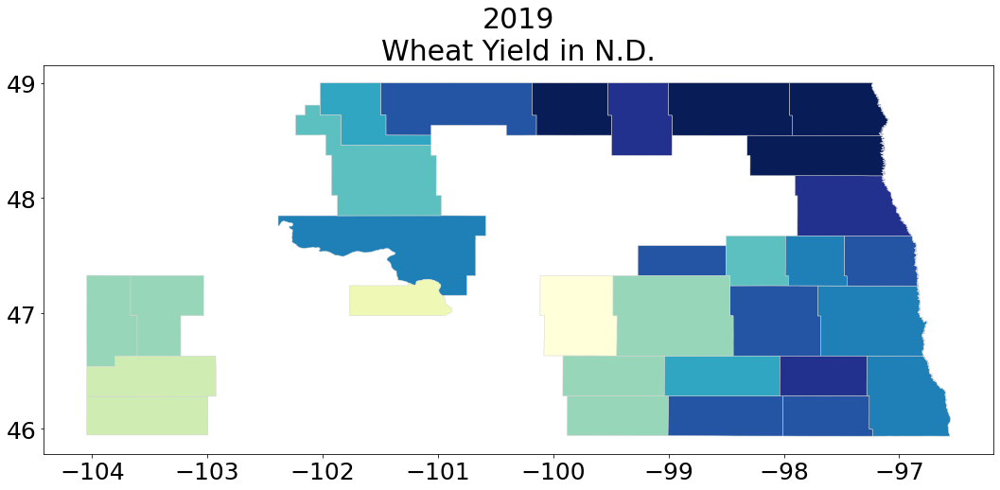

In [19]:
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Yield"
# change colors, divide into n distinct colors
cmap = cm.get_cmap('YlGnBu', 10)
vmin = 35 
vmax = df[key].max()

norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
plt.cm.ScalarMappable(cmap=cmap, norm=norm)
df = wheat_data[wheat_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)

ax.set_title(str(date) + "\n" + "Wheat Yield in N.D.", fontsize = 30)

Text(0.5, 1.0, '2019\nWheat Yield in N.D.')

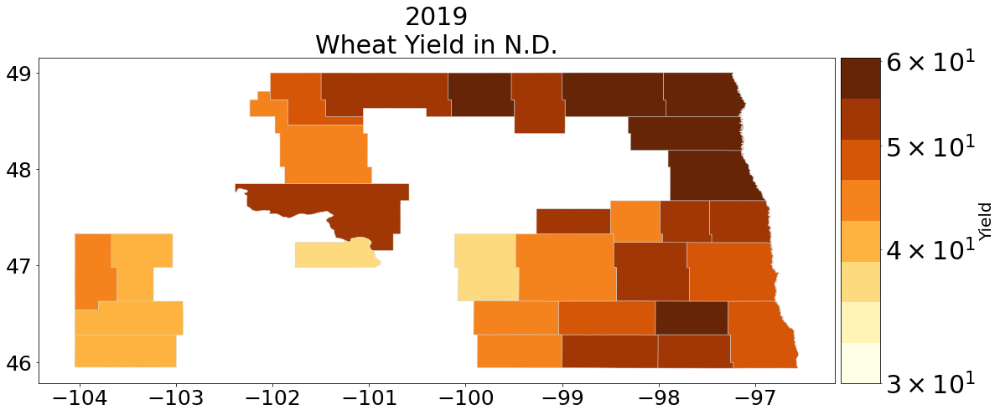

In [20]:
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Yield"
df = wheat_data[wheat_data.index.get_level_values("date")==date]
cmap = cm.get_cmap('YlOrBr', 8)
vmin = 30 
vmax = df[key].max()
norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)

#add colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
#empty array for the data range
sm._A = []
#prepare space for colorbar
divider = make_axes_locatable(ax)
size = "5%" 
cax = divider.append_axes("right", size = size, pad = .1)
#add colorbar to figure
cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
cbar.ax.tick_params(labelsize=18)
vals = list(cbar.ax.get_yticks())
vals.append(vmax)
#format colorbar values as int
cbar.ax.set_yticklabels([int(x) for x in vals])
cbar.ax.set_ylabel(key, fontsize = 20)


df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)
ax.set_title(str(date)[:10] + "\n" + "Wheat Yield in N.D.", fontsize = 30)

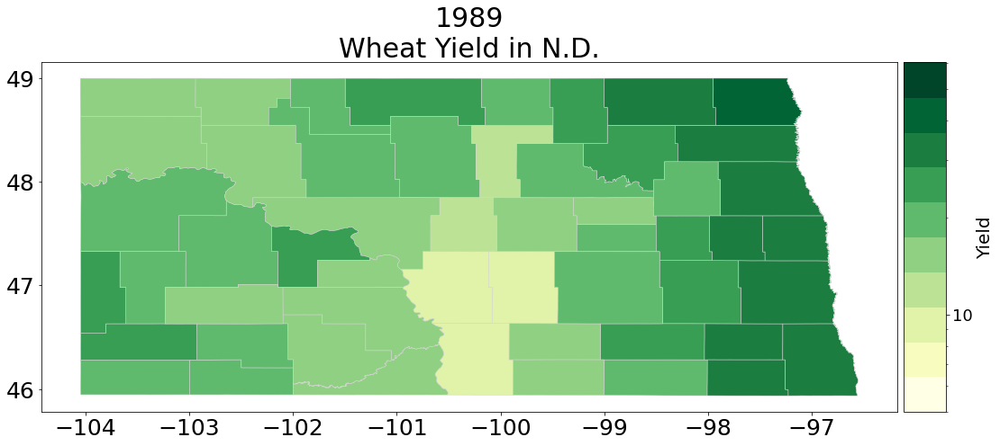

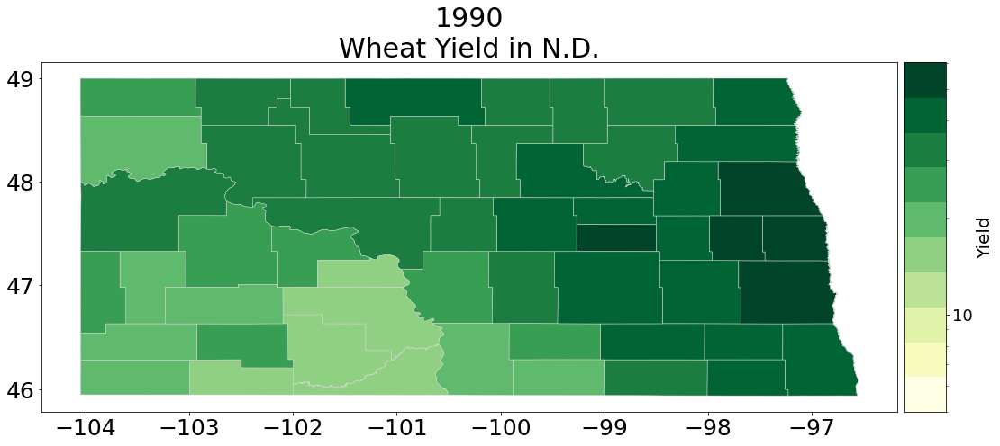

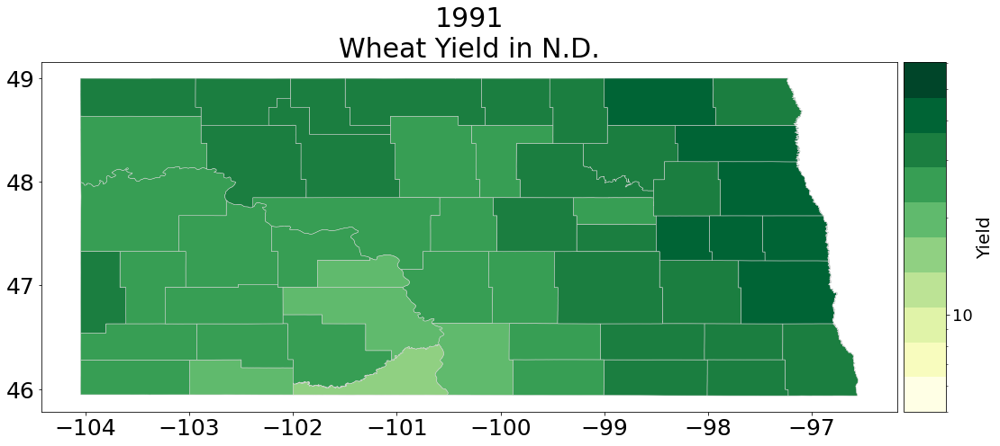

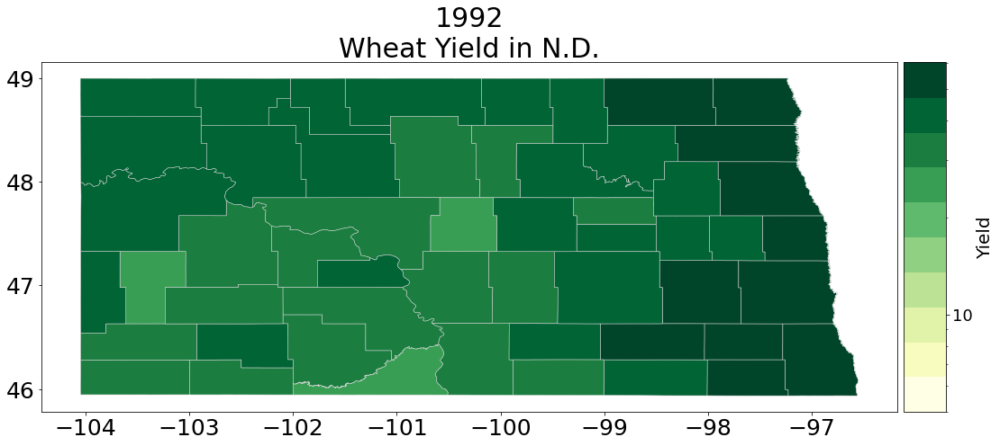

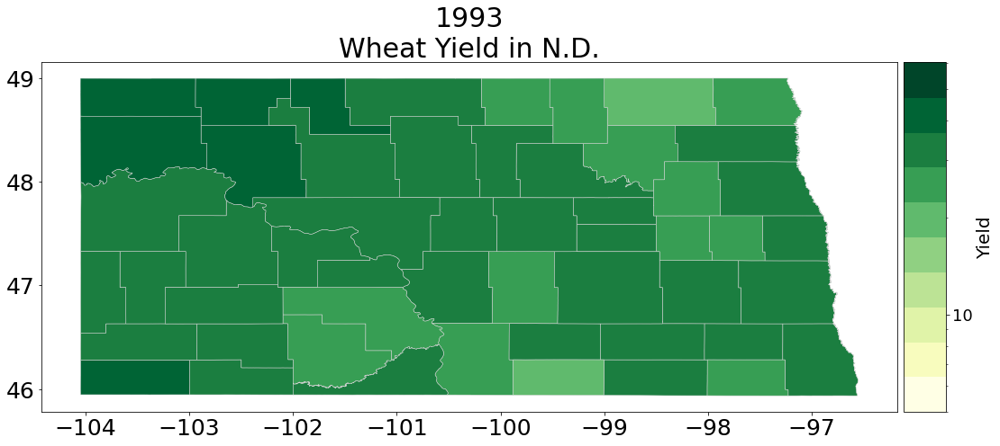

...

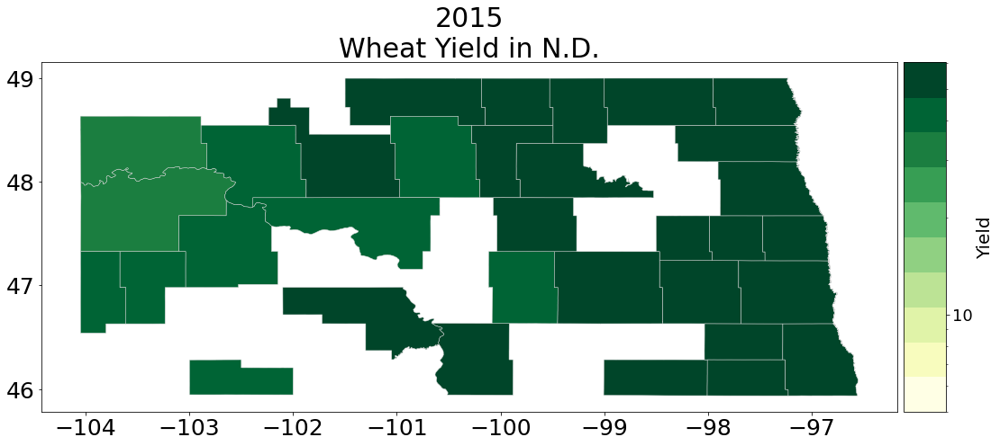

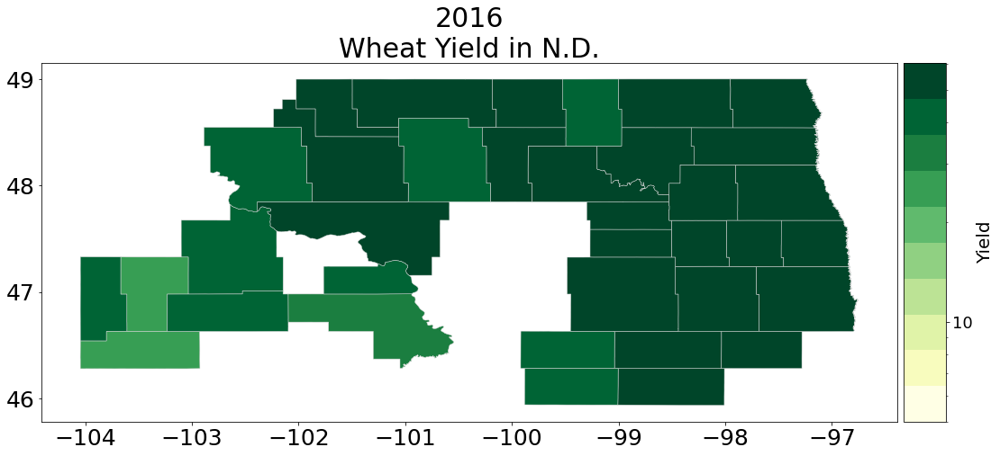

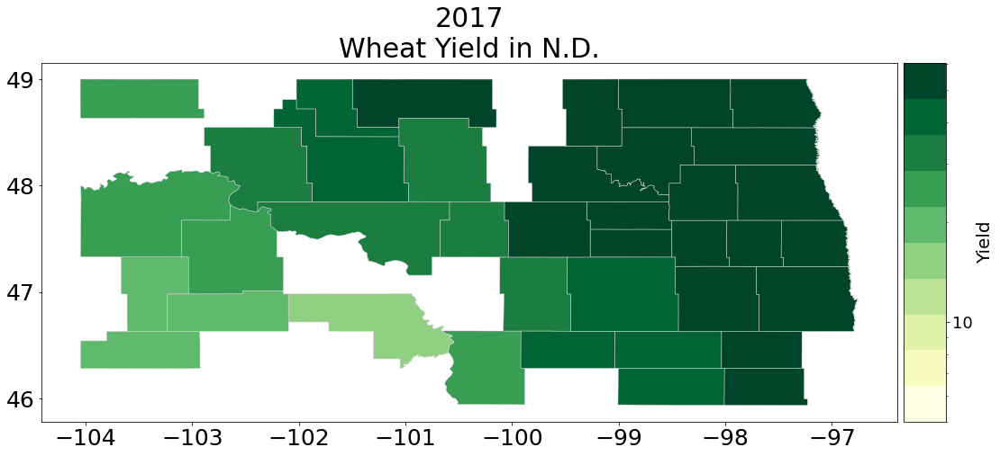

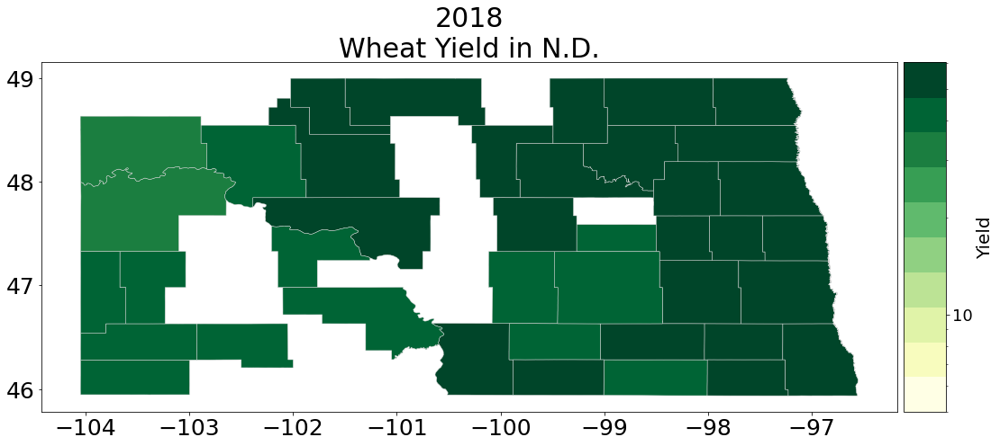

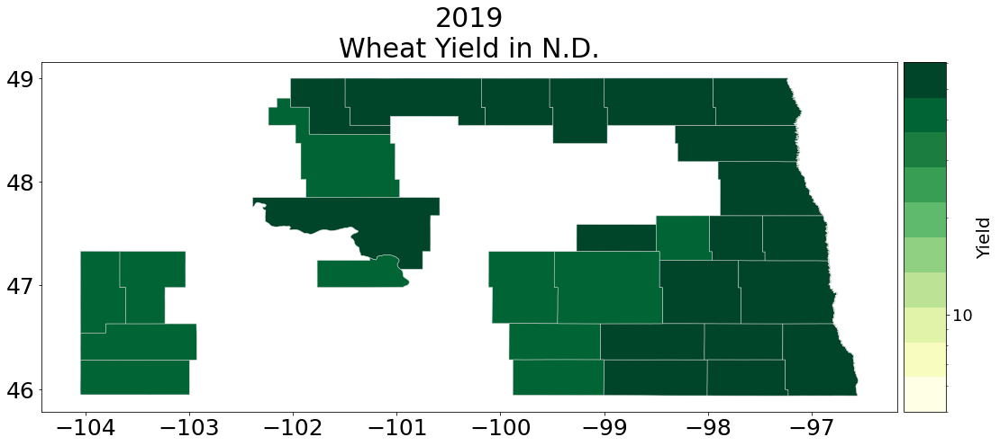

In [21]:
import geopandas
import numpy as np
import pandas as pd
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages("Wheat_Map.pdf")

keys = ["Yield"]

dates = sorted(list(set(wheat_data.index.get_level_values("date"))))
#dates = [date for date in dates if "15" in date]


for key in keys:
    vmin = 5 
    vmax = df[key].max()
    
    for date in dates:
        log = False if "Daily" in key else True
        fig, ax = plt.subplots(figsize=(18,8),
            subplot_kw = {'aspect': 'equal'})   
        plt.rcParams.update({"font.size": 30})
        plt.xticks(fontsize = 25)
        plt.yticks(fontsize = 25)
        # this time we replace 0 values with 1
        # so that these values show up as beige instead of as white
        # when color axis is logged
        df = wheat_data[wheat_data.index.get_level_values("date")==date].replace(0,1)
 
        # choose colormap
        cmap = cm.get_cmap('YlGn', 10)
        # format colormap
        if log:
            norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
        else:
            norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        # empty array for the data range
        sm._A = []
        # prepare space for colorbar
        divider = make_axes_locatable(ax)
        size = "5%" 
        cax = divider.append_axes("right", size = size, pad = 0.1)
        # add colorbar to figure
        cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
        cbar.ax.tick_params(labelsize=18)
        vals = list(cbar.ax.get_yticks())
        vals.append(vmax)

        # format colorbar values as int
        cbar.ax.set_yticklabels([int(x) for x in vals])
        cbar.ax.set_ylabel(key, fontsize = 20)


        df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                     cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                     norm = norm)
        ax.set_title(str(date)[:10] + "\n" + "Wheat Yield in N.D.", fontsize = 30)

        plt.show()
        pp.savefig(fig, bbox_inches="tight")
        plt.close()
    
pp.close()

# #3

Download and plot data relating to the magnitude of the policy response by U.S. state or by all nations across the globe. Plot the data on a map as it changes over time using an MP4 file or a GIF.

In [1]:
import geopandas
import numpy as np
import pandas as pd
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

covidresponse_data = pd.read_csv("OxCGRT_latest.csv",
                    index_col = [1, 4], parse_dates = True)
                                 #dtype={"C1_Schoolclosing": "Int64"})
covidresponse_data

C:\Users\gwens\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


CountryName RegionName RegionCode  C1_School closing  \
CountryCode Date                                                              
ABW         2020-01-01       Aruba        NaN        NaN                0.0   
            2020-01-02       Aruba        NaN        NaN                0.0   
            2020-01-03       Aruba        NaN        NaN                0.0   
            2020-01-04       Aruba        NaN        NaN                0.0   
            2020-01-05       Aruba        NaN        NaN                0.0   
...                            ...        ...        ...                ...   
ZWE         2020-11-14    Zimbabwe        NaN        NaN                1.0   
            2020-11-15    Zimbabwe        NaN        NaN                1.0   
            2020-11-16    Zimbabwe        NaN        NaN                1.0   
            2020-11-17    Zimbabwe        NaN        NaN                NaN   
            2020-11-18    Zimbabwe        NaN        NaN                NaN   

                        C1_Flag  C2_Workplace closing  C2_Flag  \
CountryCode Date                                                 
ABW         2020-01-01      NaN                   0.0      NaN   
            2020-01-02      NaN                   0.0      NaN   
            2020-01-03      NaN                   0.0      NaN   
            2020-01-04      NaN                   0.0      NaN   
            2020-01-05      NaN                   0.0      NaN   
...                         ...                   ...      ...   
ZWE         2020-11-14      1.0                   1.0      1.0   
            2020-11-15      1.0                   1.0      1.0   
            2020-11-16      1.0                   1.0      1.0   
            2020-11-17      NaN                   NaN      NaN   
            2020-11-18      NaN                   NaN      NaN   

                        C3_Cancel public events  C3_Flag  \
CountryCode Date                                           
ABW         2020-01-01                      0.0      NaN   
            2020-01-02                      0.0      NaN   
            2020-01-03                      0.0      NaN   
            2020-01-04                      0.0      NaN   
            2020-01-05                      0.0      NaN   
...                                         ...      ...   
ZWE         2020-11-14                      2.0      1.0   
            2020-11-15                      2.0      1.0   
            2020-11-16                      2.0      1.0   
            2020-11-17                      NaN      NaN   
            2020-11-18                      NaN      NaN   

                        C4_Restrictions on gatherings  ...  StringencyIndex  \
CountryCode Date                                       ...                    
ABW         2020-01-01                            0.0  ...             0.00   
            2020-01-02                            0.0  ...             0.00   
            2020-01-03                            0.0  ...             0.00   
            2020-01-04                            0.0  ...             0.00   
            2020-01-05                            0.0  ...             0.00   
...                                               ...  ...              ...   
ZWE         2020-11-14                            3.0  ...            67.59   
            2020-11-15                            3.0  ...            67.59   
            2020-11-16                            3.0  ...            67.59   
            2020-11-17                            NaN  ...              NaN   
            2020-11-18                            NaN  ...              NaN   

                        StringencyIndexForDisplay  StringencyLegacyIndex  \
CountryCode Date                                                           
ABW         2020-01-01                       0.00                   0.00   
            2020-01-02                       0.00                   0.00   
            2020-01-03 

In [2]:
df_keys = list(covidresponse_data.keys())
df_keys.remove("CountryName")
df_keys.remove("RegionName")
df_keys.remove("RegionCode")
df_keys

['C1_School closing',
 'C1_Flag',
 'C2_Workplace closing',
 'C2_Flag',
 'C3_Cancel public events',
 'C3_Flag',
 'C4_Restrictions on gatherings',
 'C4_Flag',
 'C5_Close public transport',
 'C5_Flag',
 'C6_Stay at home requirements',
 'C6_Flag',
 'C7_Restrictions on internal movement',
 'C7_Flag',
 'C8_International travel controls',
 'E1_Income support',
 'E1_Flag',
 'E2_Debt/contract relief',
 'E3_Fiscal measures',
 'E4_International support',
 'H1_Public information campaigns',
 'H1_Flag',
 'H2_Testing policy',
 'H3_Contact tracing',
 'H4_Emergency investment in healthcare',
 'H5_Investment in vaccines',
 'H6_Facial Coverings',
 'H6_Flag',
 'M1_Wildcard',
 'ConfirmedCases',
 'ConfirmedDeaths',
 'StringencyIndex',
 'StringencyIndexForDisplay',
 'StringencyLegacyIndex',
 'StringencyLegacyIndexForDisplay',
 'GovernmentResponseIndex',
 'GovernmentResponseIndexForDisplay',
 'ContainmentHealthIndex',
 'ContainmentHealthIndexForDisplay',
 'EconomicSupportIndex',
 'EconomicSupportIndexForDisp

In [3]:
covidresponse_data = pd.read_csv("OxCGRT_latest.csv",
                    index_col = [1, 4], parse_dates = True,
                                 dtype={key:float for key in df_keys})
covidresponse_data

C:\Users\gwens\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


CountryName RegionName RegionCode  C1_School closing  \
CountryCode Date                                                              
ABW         2020-01-01       Aruba        NaN        NaN                0.0   
            2020-01-02       Aruba        NaN        NaN                0.0   
            2020-01-03       Aruba        NaN        NaN                0.0   
            2020-01-04       Aruba        NaN        NaN                0.0   
            2020-01-05       Aruba        NaN        NaN                0.0   
...                            ...        ...        ...                ...   
ZWE         2020-11-14    Zimbabwe        NaN        NaN                1.0   
            2020-11-15    Zimbabwe        NaN        NaN                1.0   
            2020-11-16    Zimbabwe        NaN        NaN                1.0   
            2020-11-17    Zimbabwe        NaN        NaN                NaN   
            2020-11-18    Zimbabwe        NaN        NaN                NaN   

                        C1_Flag  C2_Workplace closing  C2_Flag  \
CountryCode Date                                                 
ABW         2020-01-01      NaN                   0.0      NaN   
            2020-01-02      NaN                   0.0      NaN   
            2020-01-03      NaN                   0.0      NaN   
            2020-01-04      NaN                   0.0      NaN   
            2020-01-05      NaN                   0.0      NaN   
...                         ...                   ...      ...   
ZWE         2020-11-14      1.0                   1.0      1.0   
            2020-11-15      1.0                   1.0      1.0   
            2020-11-16      1.0                   1.0      1.0   
            2020-11-17      NaN                   NaN      NaN   
            2020-11-18      NaN                   NaN      NaN   

                        C3_Cancel public events  C3_Flag  \
CountryCode Date                                           
ABW         2020-01-01                      0.0      NaN   
            2020-01-02                      0.0      NaN   
            2020-01-03                      0.0      NaN   
            2020-01-04                      0.0      NaN   
            2020-01-05                      0.0      NaN   
...                                         ...      ...   
ZWE         2020-11-14                      2.0      1.0   
            2020-11-15                      2.0      1.0   
            2020-11-16                      2.0      1.0   
            2020-11-17                      NaN      NaN   
            2020-11-18                      NaN      NaN   

                        C4_Restrictions on gatherings  ...  StringencyIndex  \
CountryCode Date                                       ...                    
ABW         2020-01-01                            0.0  ...             0.00   
            2020-01-02                            0.0  ...             0.00   
            2020-01-03                            0.0  ...             0.00   
            2020-01-04                            0.0  ...             0.00   
            2020-01-05                            0.0  ...             0.00   
...                                               ...  ...              ...   
ZWE         2020-11-14                            3.0  ...            67.59   
            2020-11-15                            3.0  ...            67.59   
            2020-11-16                            3.0  ...            67.59   
            2020-11-17                            NaN  ...              NaN   
            2020-11-18                            NaN  ...              NaN   

                        StringencyIndexForDisplay  StringencyLegacyIndex  \
CountryCode Date                                                           
ABW         2020-01-01                       0.00                   0.00   
            2020-01-02                       0.00                   0.00   
            2020-01-03 

In [4]:
countries = covidresponse_data.groupby("CountryCode").mean().index
countries

Index(['ABW', 'AFG', 'AGO', 'AIA', 'ALB', 'AND', 'ARE', 'ARG', 'AUS', 'AUT',
       ...
       'UZB', 'VEN', 'VGB', 'VIR', 'VNM', 'VUT', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='CountryCode', length=189)

In [5]:
dates = covidresponse_data.groupby("Date")
dates

In [6]:
covidresponse_data.groupby("Date").sum()

,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,...,StringencyIndex,StringencyIndexForDisplay,StringencyLegacyIndex,StringencyLegacyIndexForDisplay,GovernmentResponseIndex,GovernmentResponseIndexForDisplay,ContainmentHealthIndex,ContainmentHealthIndexForDisplay,EconomicSupportIndex,EconomicSupportIndexForDisplay
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,45.84,45.84,62.39,62.39,54.75,54.75,63.89,63.89,0.0,0.0
2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,65.28,65.28,89.78,89.78,69.63,69.63,81.25,81.25,0.0,0.0
2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,70.84,70.84,99.30,99.30,73.20,73.20,85.42,85.42,0.0,0.0
2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,70.84,70.84,99.30,99.30,73.20,73.20,85.42,85.42,0.0,0.0
2020-01-05,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,73.62,73.62,104.06,104.06,78.55,78.55,91.67,91.67,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-14,255.0,96.0,216.0,113.0,212.0,124.0,442.0,104.0,70.0,38.0,...,8173.61,12163.89,9380.26,13913.62,8677.66,12816.06,8826.03,13231.62,7900.0,10812.5
2020-11-15,229.0,87.0,189.0,103.0,194.0,114.0,399.0,94.0,59.0,32.0,...,7362.94,12054.16,8462.87,13786.23,7859.50,12696.41,7979.83,13108.70,7250.0,10712.5
2020-11-16,154.0,58.0,128.0,67.0,135.0,73.0,258.0,57.0,42.0,25.0,...,4916.67,11576.37,5693.11,13226.22,5302.67,12183.02,5344.74,12574.33,5112.5,10325.0


In [7]:
covidresponse_data.to_csv("CovidResponse.csv")

In [8]:
for key in covidresponse_data.keys():
    print(key,covidresponse_data[key].dtype)

CountryName object
RegionName object
RegionCode object
C1_School closing float64
C1_Flag float64
C2_Workplace closing float64
C2_Flag float64
C3_Cancel public events float64
C3_Flag float64
C4_Restrictions on gatherings float64
C4_Flag float64
C5_Close public transport float64
C5_Flag float64
C6_Stay at home requirements float64
C6_Flag float64
C7_Restrictions on internal movement float64
C7_Flag float64
C8_International travel controls float64
E1_Income support float64
E1_Flag float64
E2_Debt/contract relief float64
E3_Fiscal measures float64
E4_International support float64
H1_Public information campaigns float64
H1_Flag float64
H2_Testing policy float64
H3_Contact tracing float64
H4_Emergency investment in healthcare float64
H5_Investment in vaccines float64
H6_Facial Coverings float64
H6_Flag float64
M1_Wildcard float64
ConfirmedCases float64
ConfirmedDeaths float64
StringencyIndex float64
StringencyIndexForDisplay float64
StringencyLegacyIndex float64
StringencyLegacyIndexForDispl

In [9]:
df = pd.DataFrame(covidresponse_data)
print(df)

                       CountryName RegionName RegionCode  C1_School closing  \
CountryCode Date                                                              
ABW         2020-01-01       Aruba        NaN        NaN                0.0   
            2020-01-02       Aruba        NaN        NaN                0.0   
            2020-01-03       Aruba        NaN        NaN                0.0   
            2020-01-04       Aruba        NaN        NaN                0.0   
            2020-01-05       Aruba        NaN        NaN                0.0   
...                            ...        ...        ...                ...   
ZWE         2020-11-14    Zimbabwe        NaN        NaN                1.0   
            2020-11-15    Zimbabwe        NaN        NaN                1.0   
            2020-11-16    Zimbabwe        NaN        NaN                1.0   
            2020-11-17    Zimbabwe        NaN        NaN                NaN   
            2020-11-18    Zimbabwe        NaN       

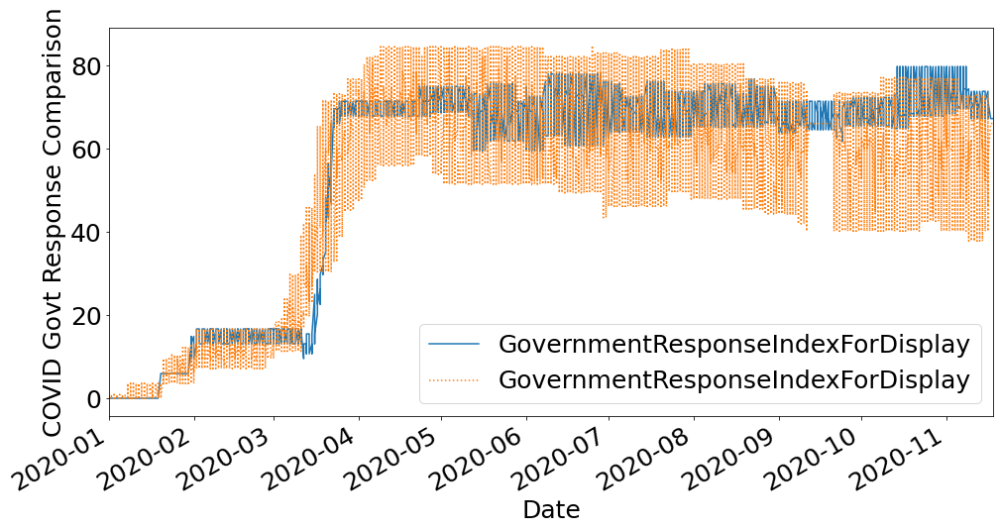

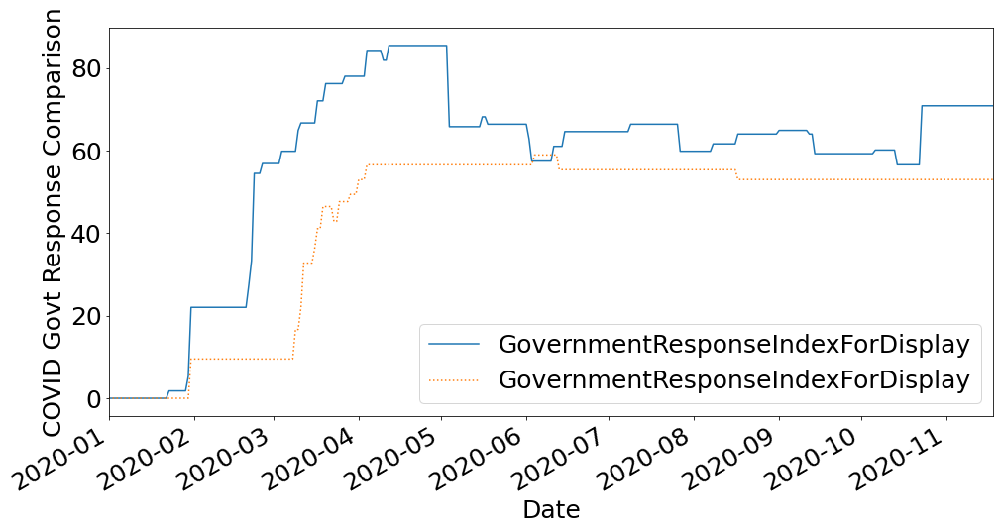

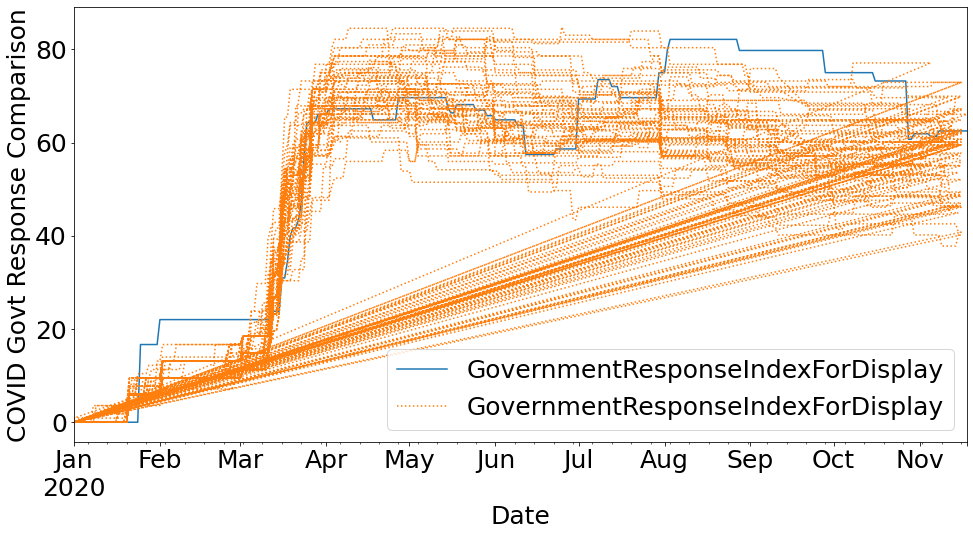

In [10]:
# pairs of countries to compare in plots
pairs = [("GBR", "USA"), ("ITA", "SWE"), ("AUS", "USA")]
linestyles = ["-", ":"]

plt.rcParams.update({"font.size": 25})
for pair in pairs:
    fig, ax = plt.subplots(figsize= (16, 8))
    for i in range(len(pair)):
        country_code = pair[i]
        # gather country name associated with country_code
        country_name = df.loc[country_code]["CountryName"]
        linestyle = linestyles[i]
        # plot country, and all dataes (:)
        df.loc[country_code, :][["GovernmentResponseIndexForDisplay"]].dropna(
            ).plot.line(ax = ax, label = country_name,
                       linestyle = linestyle)
    plt.xlim(["2020-01-01 00:00:00", "2020-11-18 00:00:00"])
    plt.ylabel("COVID Govt Response Comparison")
    plt.legend()
    plt.show()
    plt.close()

In [12]:
for key in df_keys:
    covidresponse_data[key]=covidresponse_data.groupby("CountryCode")[key].diff()

In [13]:
covidresponse_data

CountryName RegionName RegionCode  C1_School closing  \
CountryCode Date                                                              
ABW         2020-01-01       Aruba        NaN        NaN                NaN   
            2020-01-02       Aruba        NaN        NaN                0.0   
            2020-01-03       Aruba        NaN        NaN                0.0   
            2020-01-04       Aruba        NaN        NaN                0.0   
            2020-01-05       Aruba        NaN        NaN                0.0   
...                            ...        ...        ...                ...   
ZWE         2020-11-14    Zimbabwe        NaN        NaN                0.0   
            2020-11-15    Zimbabwe        NaN        NaN                0.0   
            2020-11-16    Zimbabwe        NaN        NaN                0.0   
            2020-11-17    Zimbabwe        NaN        NaN                NaN   
            2020-11-18    Zimbabwe        NaN        NaN                NaN   

                        C1_Flag  C2_Workplace closing  C2_Flag  \
CountryCode Date                                                 
ABW         2020-01-01      NaN                   NaN      NaN   
            2020-01-02      NaN                   0.0      NaN   
            2020-01-03      NaN                   0.0      NaN   
            2020-01-04      NaN                   0.0      NaN   
            2020-01-05      NaN                   0.0      NaN   
...                         ...                   ...      ...   
ZWE         2020-11-14      0.0                   0.0      0.0   
            2020-11-15      0.0                   0.0      0.0   
            2020-11-16      0.0                   0.0      0.0   
            2020-11-17      NaN                   NaN      NaN   
            2020-11-18      NaN                   NaN      NaN   

                        C3_Cancel public events  C3_Flag  \
CountryCode Date                                           
ABW         2020-01-01                      NaN      NaN   
            2020-01-02                      0.0      NaN   
            2020-01-03                      0.0      NaN   
            2020-01-04                      0.0      NaN   
            2020-01-05                      0.0      NaN   
...                                         ...      ...   
ZWE         2020-11-14                      0.0      0.0   
            2020-11-15                      0.0      0.0   
            2020-11-16                      0.0      0.0   
            2020-11-17                      NaN      NaN   
            2020-11-18                      NaN      NaN   

                        C4_Restrictions on gatherings  ...  StringencyIndex  \
CountryCode Date                                       ...                    
ABW         2020-01-01                            NaN  ...              NaN   
            2020-01-02                            0.0  ...              0.0   
            2020-01-03                            0.0  ...              0.0   
            2020-01-04                            0.0  ...              0.0   
            2020-01-05                            0.0  ...              0.0   
...                                               ...  ...              ...   
ZWE         2020-11-14                            0.0  ...              0.0   
            2020-11-15                            0.0  ...              0.0   
            2020-11-16                            0.0  ...              0.0   
            2020-11-17                            NaN  ...              NaN   
            2020-11-18                            NaN  ...              NaN   

                        StringencyIndexForDisplay  StringencyLegacyIndex  \
CountryCode Date                                                           
ABW         2020-01-01                        NaN                    NaN   
            2020-01-02                        0.0                    0.0   
            2020-01-03 

In [14]:
df_diff = pd.DataFrame(covidresponse_data)
print(df_diff)

                       CountryName RegionName RegionCode  C1_School closing  \
CountryCode Date                                                              
ABW         2020-01-01       Aruba        NaN        NaN                NaN   
            2020-01-02       Aruba        NaN        NaN                0.0   
            2020-01-03       Aruba        NaN        NaN                0.0   
            2020-01-04       Aruba        NaN        NaN                0.0   
            2020-01-05       Aruba        NaN        NaN                0.0   
...                            ...        ...        ...                ...   
ZWE         2020-11-14    Zimbabwe        NaN        NaN                0.0   
            2020-11-15    Zimbabwe        NaN        NaN                0.0   
            2020-11-16    Zimbabwe        NaN        NaN                0.0   
            2020-11-17    Zimbabwe        NaN        NaN                NaN   
            2020-11-18    Zimbabwe        NaN       

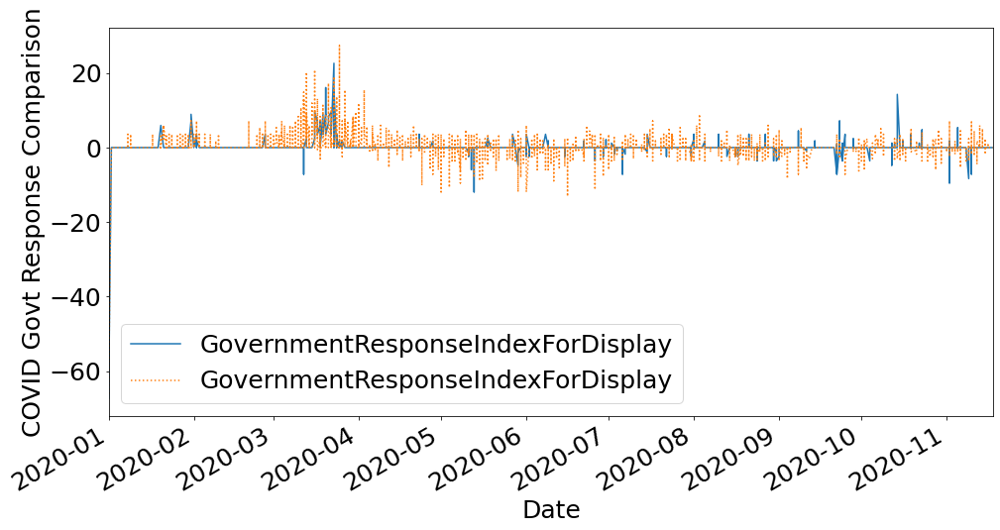

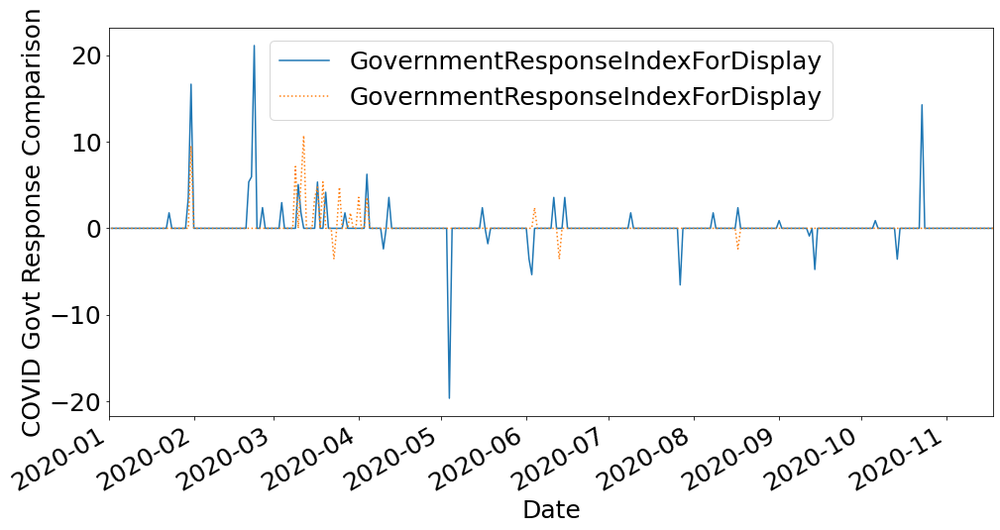

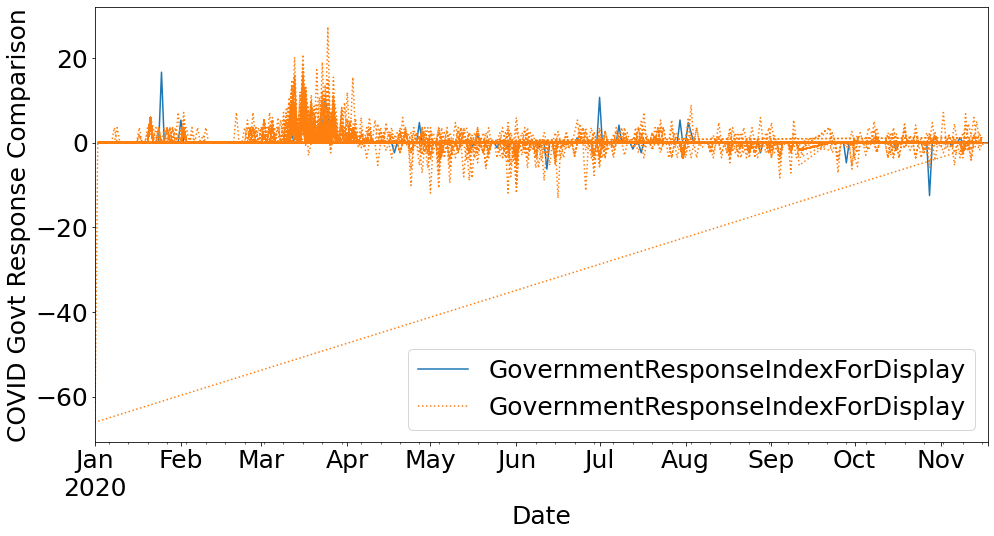

In [15]:
# pairs of countries to compare in plots
pairs = [("GBR", "USA"), ("ITA", "SWE"), ("AUS", "USA")]
linestyles = ["-", ":"]

plt.rcParams.update({"font.size": 25})
for pair in pairs:
    fig, ax = plt.subplots(figsize= (16, 8))
    for i in range(len(pair)):
        country_code = pair[i]
        # gather country name associated with country_code
        country_name = df_diff.loc[country_code]["CountryName"]
        linestyle = linestyles[i]
        # plot country, and all dataes (:)
        df_diff.loc[country_code, :][["GovernmentResponseIndexForDisplay"]].dropna(
            ).plot.line(ax = ax, label = country_name,
                       linestyle = linestyle)
    plt.xlim(["2020-01-01 00:00:00", "2020-11-18 00:00:00"])
    plt.ylabel("COVID Govt Response Comparison")
    plt.legend()
    plt.show()
    plt.close()